### All parameters - longer experiment (15000 samples)

Include the analysis script and setup the folders with raw data

In [1]:
from benchmarking.analysis.analyze_results import *

In [2]:
output_base_folder = Path("/iarai/home/ivan.svogor/storage-benchmarking-raw/referenced-experiments")
s3_folder_filter="1711-long/s3/*benchmark_e2e*"
scratch_folder_filter="1711-long/scratch/*benchmark_e2e*"

#### Load raw data

In [3]:
df_dataloader_s3 = extract_timelines(output_base_folder, folder_filter=s3_folder_filter)
df_dataloader_scratch = extract_timelines(output_base_folder, folder_filter=scratch_folder_filter)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 216/216 [00:00<00:00, 270.23it/s]


In [4]:
# Show data (to check if loaded correctly)

# df_dataloader_s3.sort_values(["start_time_x"], ascending=False)
# df_dataloader_scratch.sort_values(["start_time_x"], ascending=False)

In [5]:
# extract unique functions (for s3 and scratch, it's the same)
unique_functions_s3 = np.unique(df_dataloader_s3["item_x"])

# define colors for timelane items 
colors = {}
for i, color in zip(unique_functions_s3, ["red", "gold", "blue", "magenta", "aqua"]):
    colors[str(i)] = color
    
# define lanes (each lane is for a single function call (i.e. usage))
lanes={}
for i, lane in zip(unique_functions_s3, range(len(unique_functions_s3))):
    lanes[str(i)] = lane

# print to verify
print(f"Unique functions: {unique_functions_s3}")
print(f"Lanes: {lanes}")
    
# get the names of the runs for the iterators later on 
unique_runs_s3 = np.unique(df_dataloader_s3["run"])
unique_runs_scratch = np.unique(df_dataloader_scratch["run"])

Unique functions: ['batch' 'next_data' 'run_training_batch' 'training_batch_to_device']
Lanes: {'batch': 0, 'next_data': 1, 'run_training_batch': 2, 'training_batch_to_device': 3}


### Timeline plots 

Each line corresponds to a unique function call. 

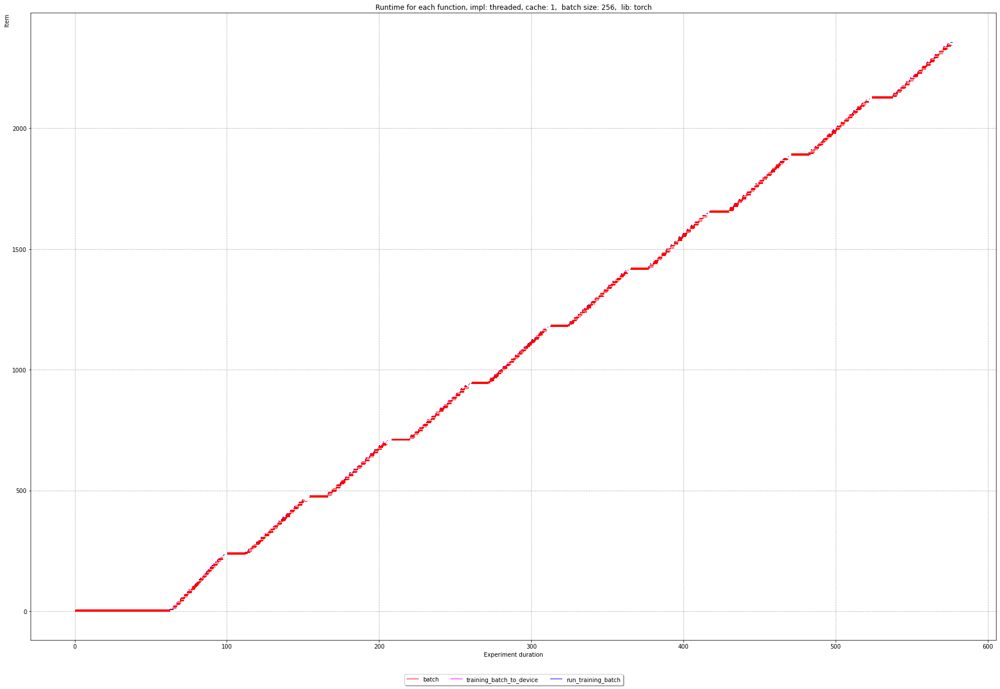

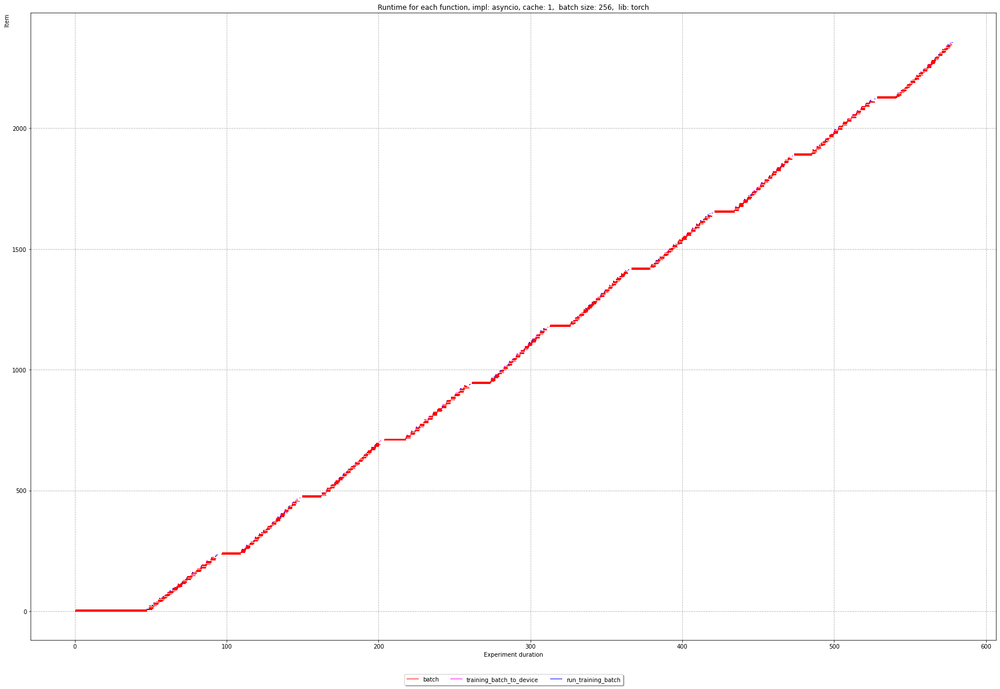

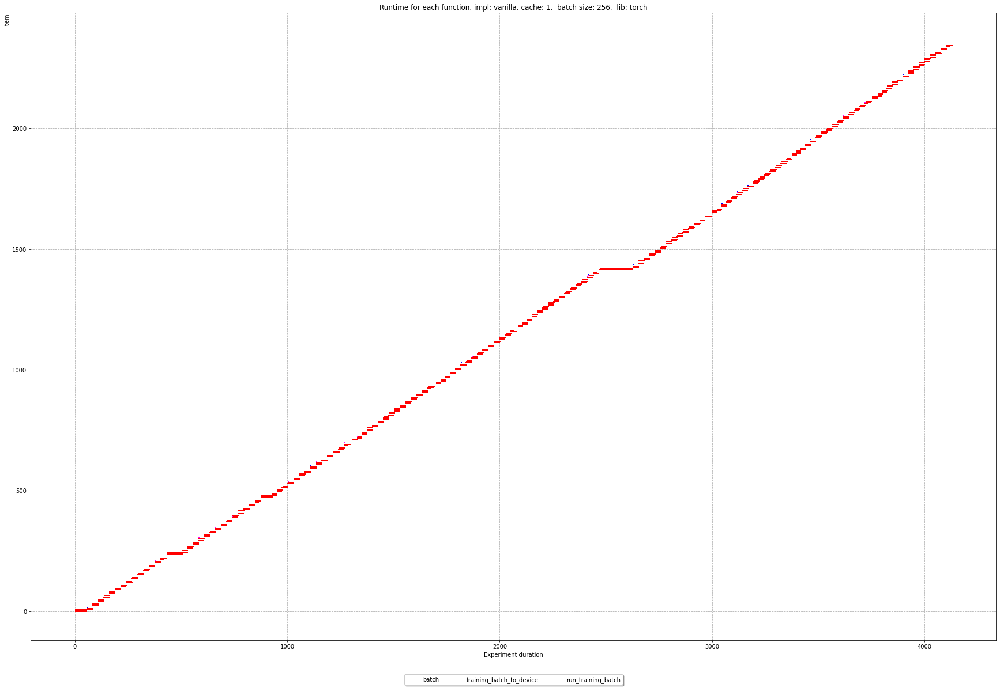

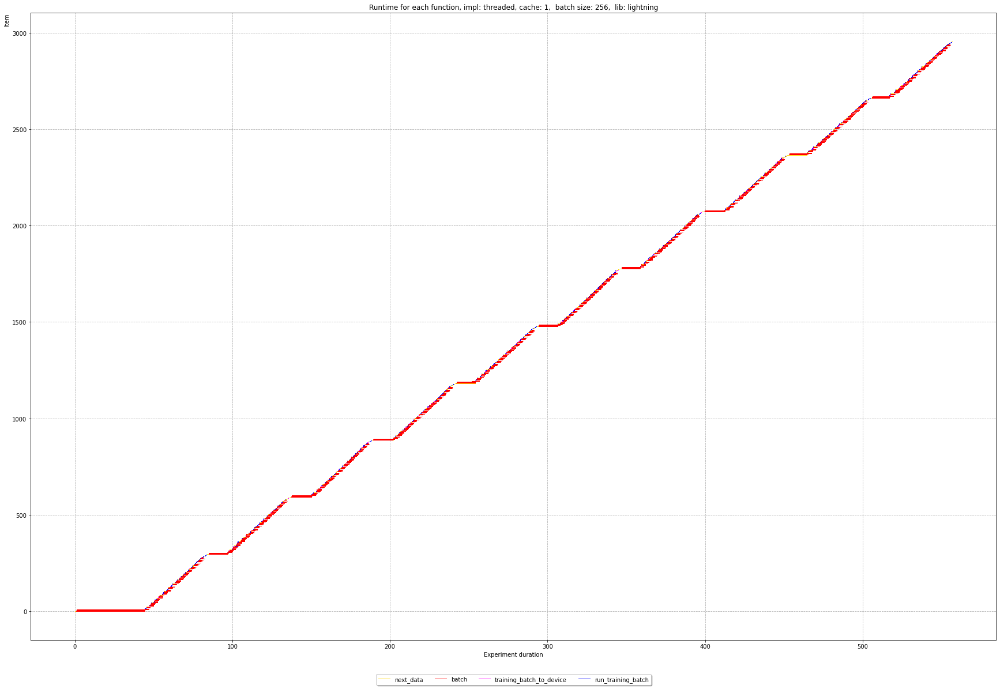

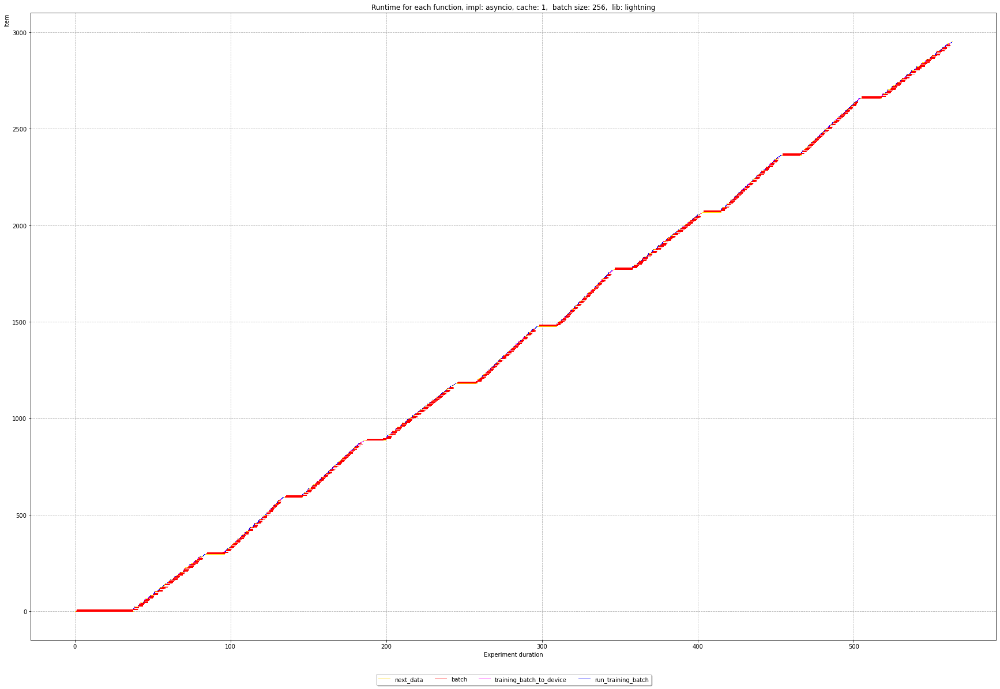

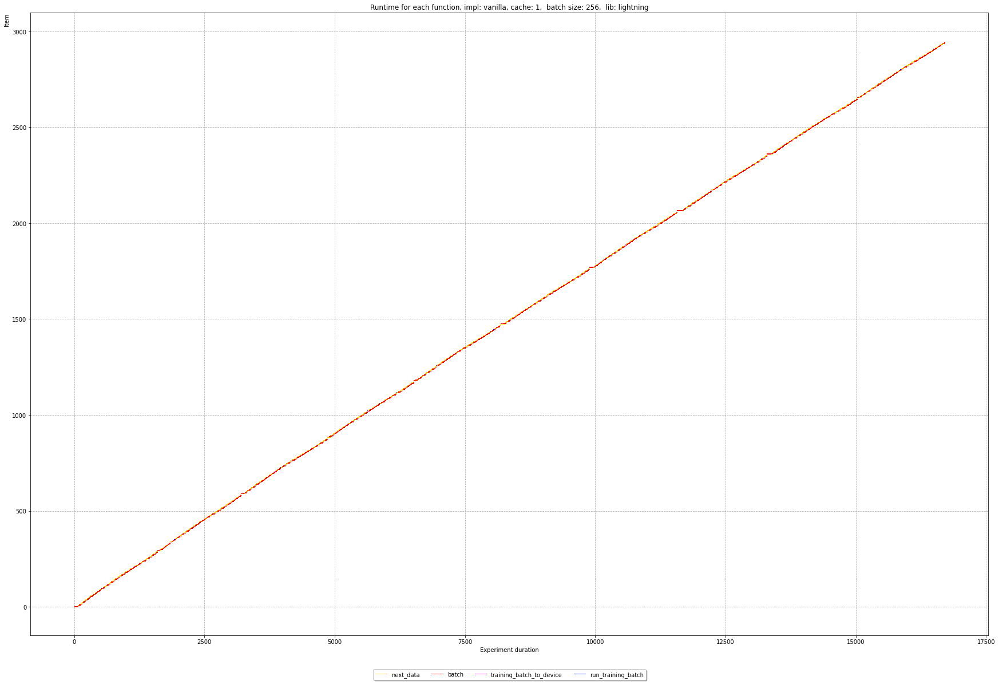

In [6]:
for implementation in ["torch", "lightning"]:
    for run in unique_runs_s3:
        if implementation in run:
            df = df_dataloader_s3[(df_dataloader_s3["run"]==run)]
            show_timelines(df, run, colors, False, False, 1)

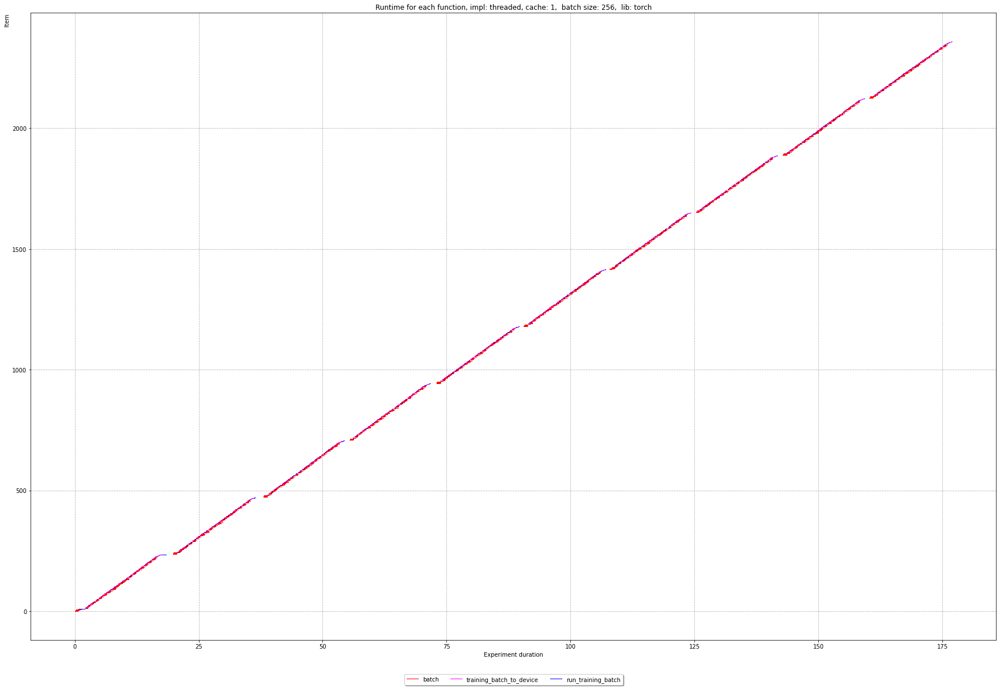

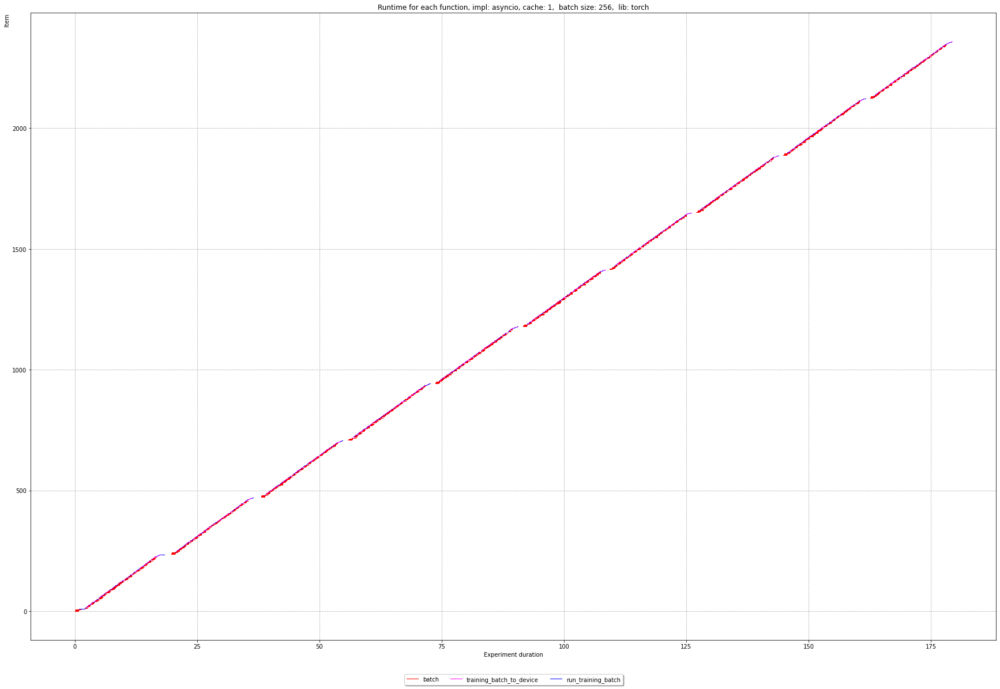

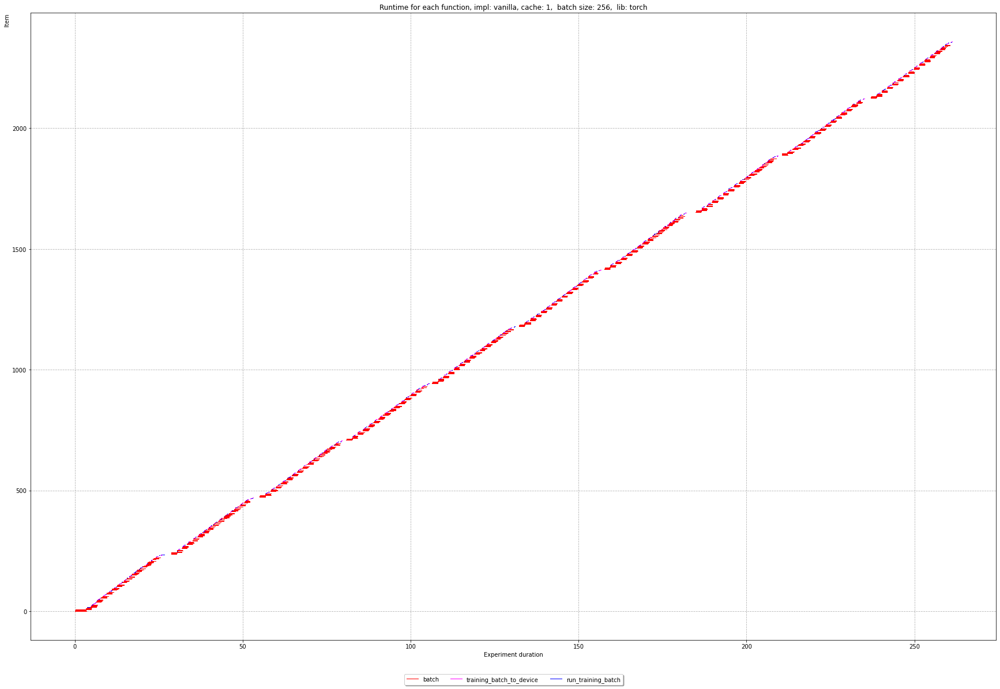

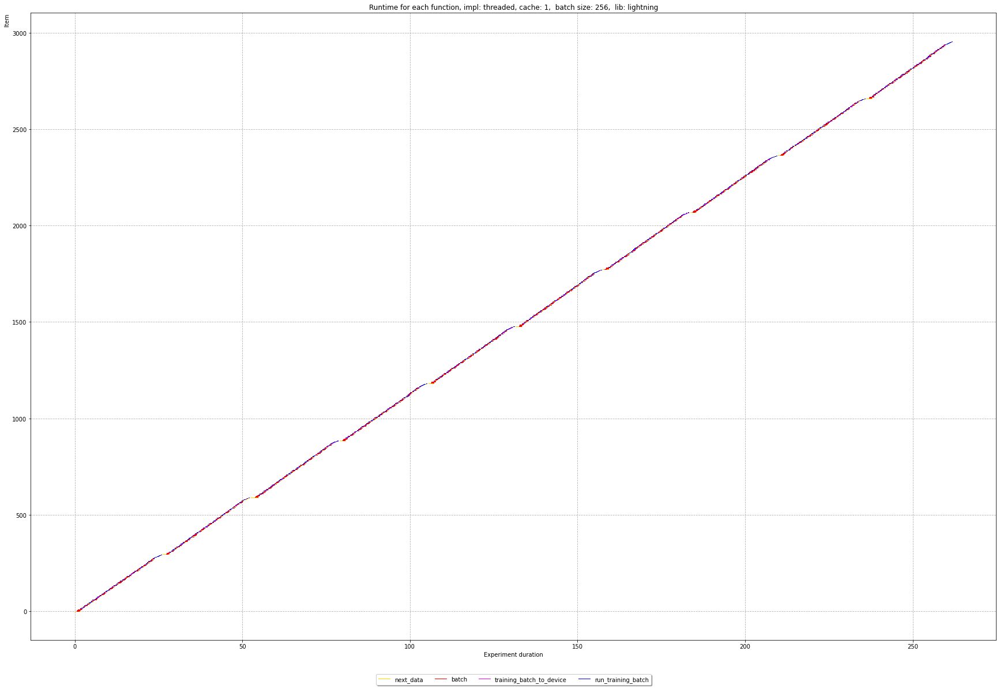

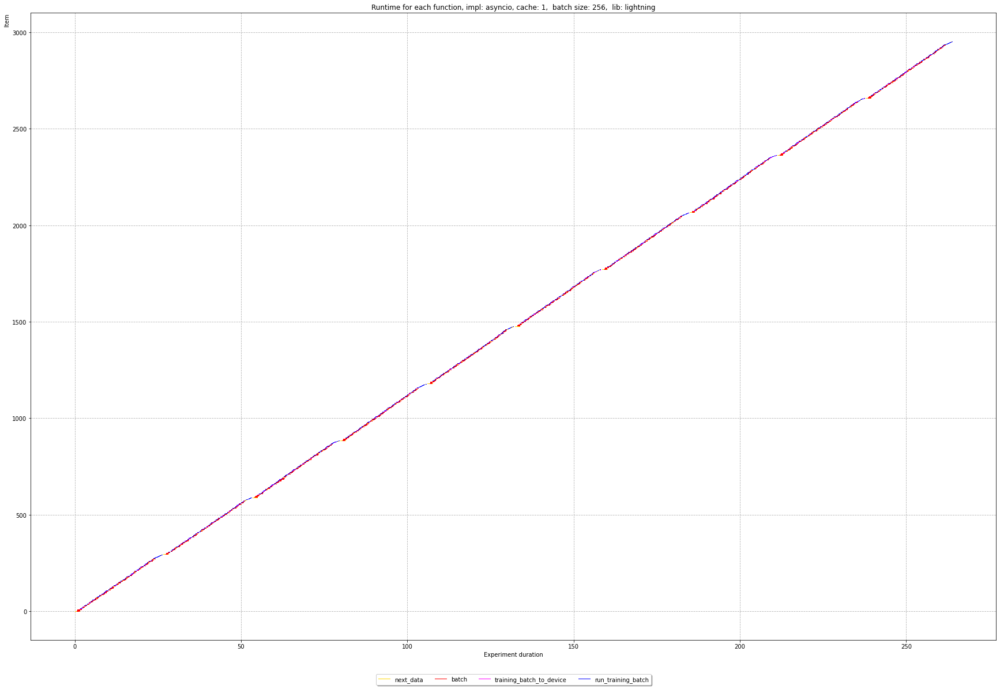

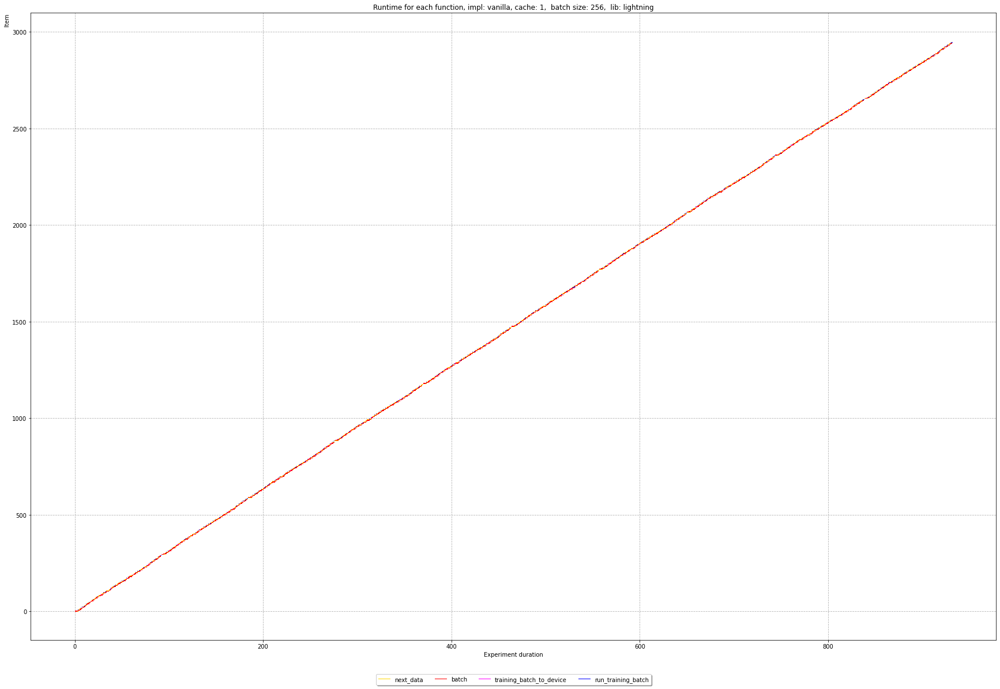

In [7]:
for implementation in ["torch", "lightning"]:
    for run in unique_runs_scratch:
        if implementation in run:
            df = df_dataloader_scratch[(df_dataloader_scratch["run"]==run)]
            show_timelines(df, run, colors, False, False, 1)

### GPU utilization

In [8]:
# Load the GPU utilization 
df_gpuutil_s3 = extract_gpuutil(output_base_folder, folder_filter=s3_folder_filter)
df_gpuutil_scratch = extract_gpuutil(output_base_folder, folder_filter=scratch_folder_filter)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 216/216 [00:00<00:00, 6470.06it/s]


In [9]:
unique_runs_s3 = np.unique(df_dataloader_s3["run"])
unique_runs_scratch = np.unique(df_dataloader_scratch["run"])
print(unique_runs_s3, unique_runs_scratch)

['20211119f214426_benchmark_e2e_torch_s3_256_4_16_1_threaded_sync'
 '20211119f215652_benchmark_e2e_lightning_s3_256_4_16_1_threaded_sync'
 '20211119f221700_benchmark_e2e_torch_s3_256_4_16_1_asyncio_sync'
 '20211119f222840_benchmark_e2e_lightning_s3_256_4_16_1_asyncio_sync'
 '20211119f224727_benchmark_e2e_torch_s3_256_4_16_1_vanilla_sync'
 '20211119f235942_benchmark_e2e_lightning_s3_256_4_16_1_vanilla_sync'] ['20211119f220733_benchmark_e2e_torch_scratch_256_4_16_1_threaded_sync'
 '20211119f221131_benchmark_e2e_lightning_scratch_256_4_16_1_threaded_sync'
 '20211119f223831_benchmark_e2e_torch_scratch_256_4_16_1_asyncio_sync'
 '20211119f224230_benchmark_e2e_lightning_scratch_256_4_16_1_asyncio_sync'
 '20211120f044034_benchmark_e2e_torch_scratch_256_4_16_1_vanilla_sync'
 '20211120f044650_benchmark_e2e_lightning_scratch_256_4_16_1_vanilla_sync']


61.154761904761905 37.05177993527508


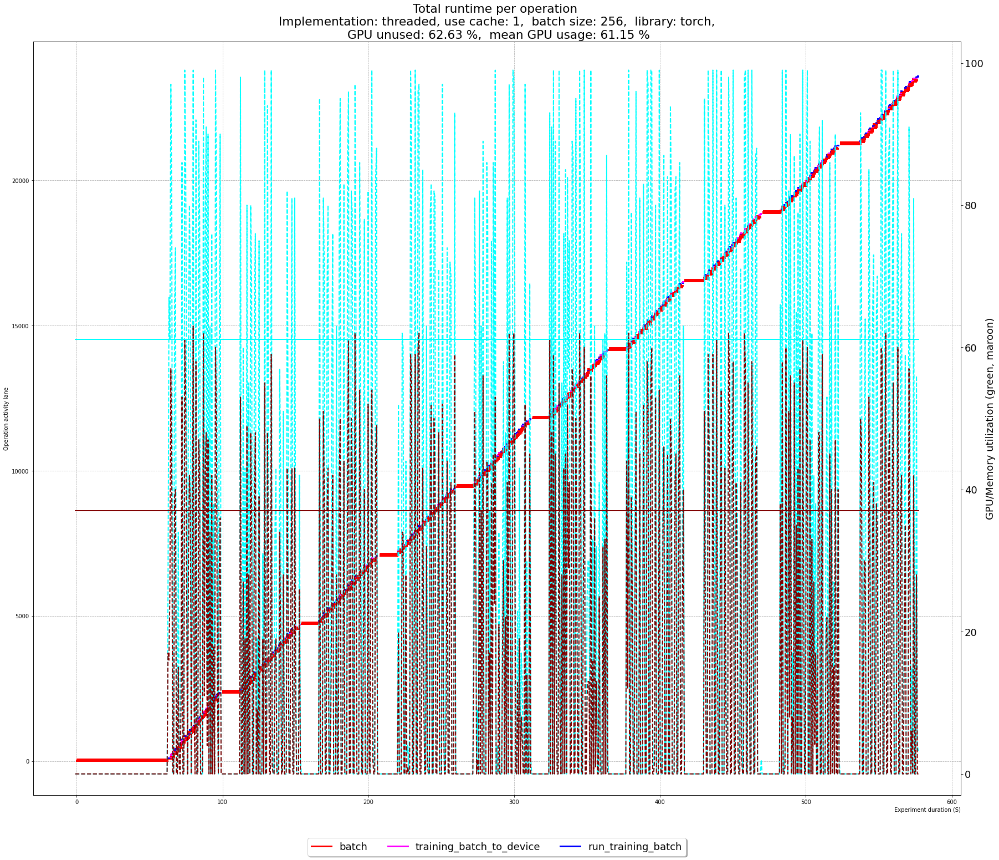

60.65981735159817 23.55968169761273


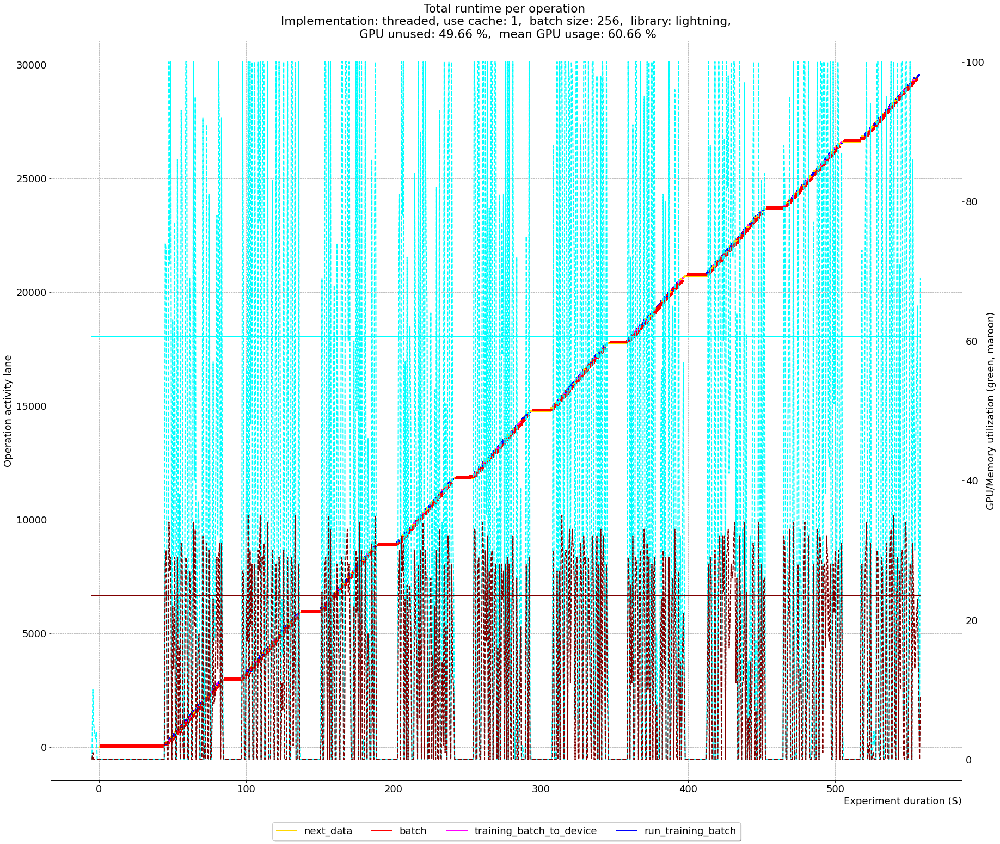

62.53211009174312 38.79933110367893


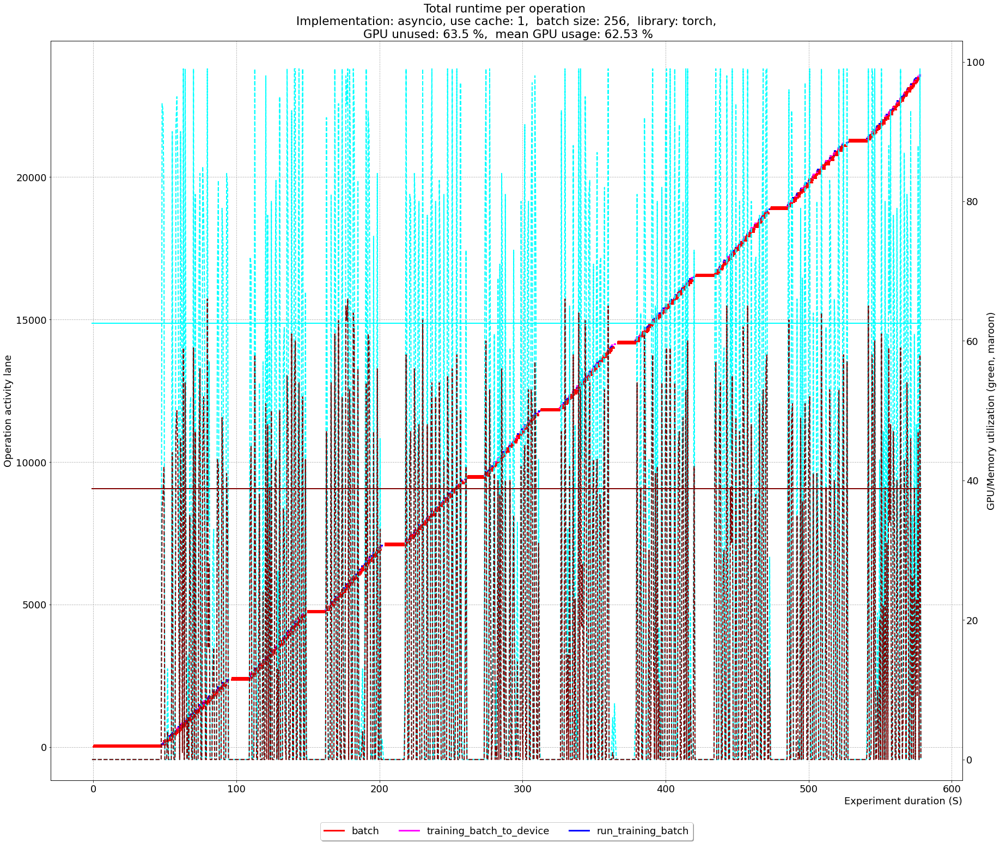

61.25376344086021 22.882494004796165


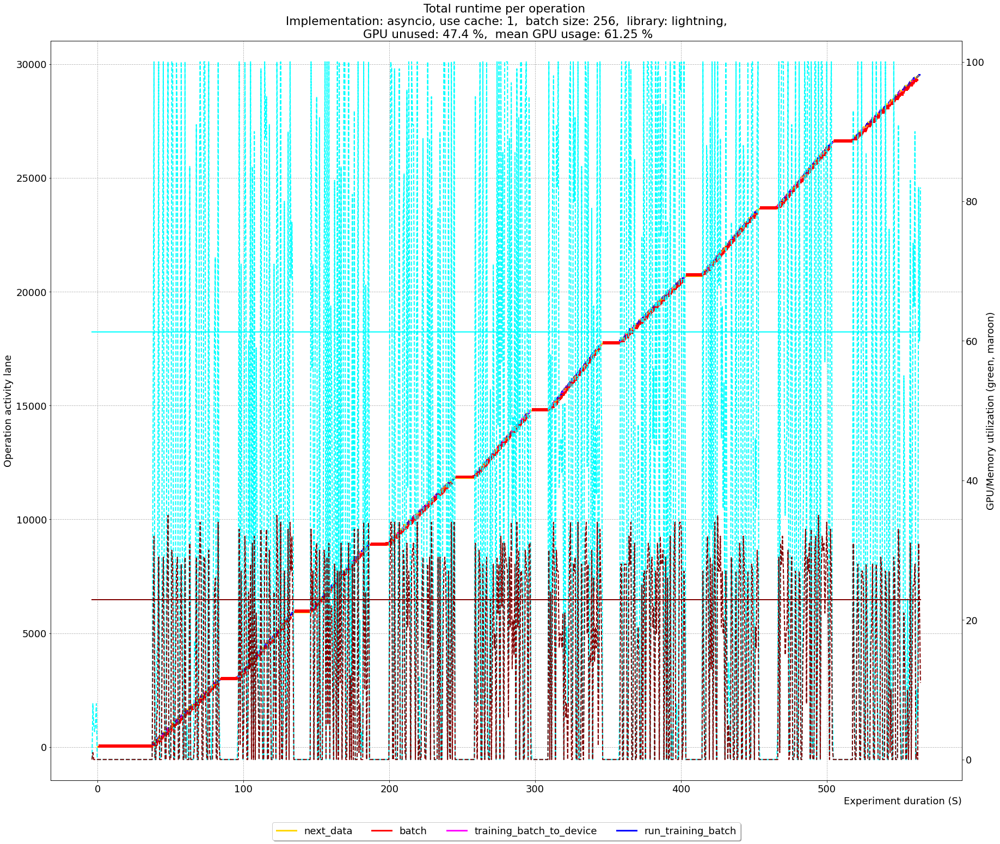

68.05501618122977 40.51567944250871


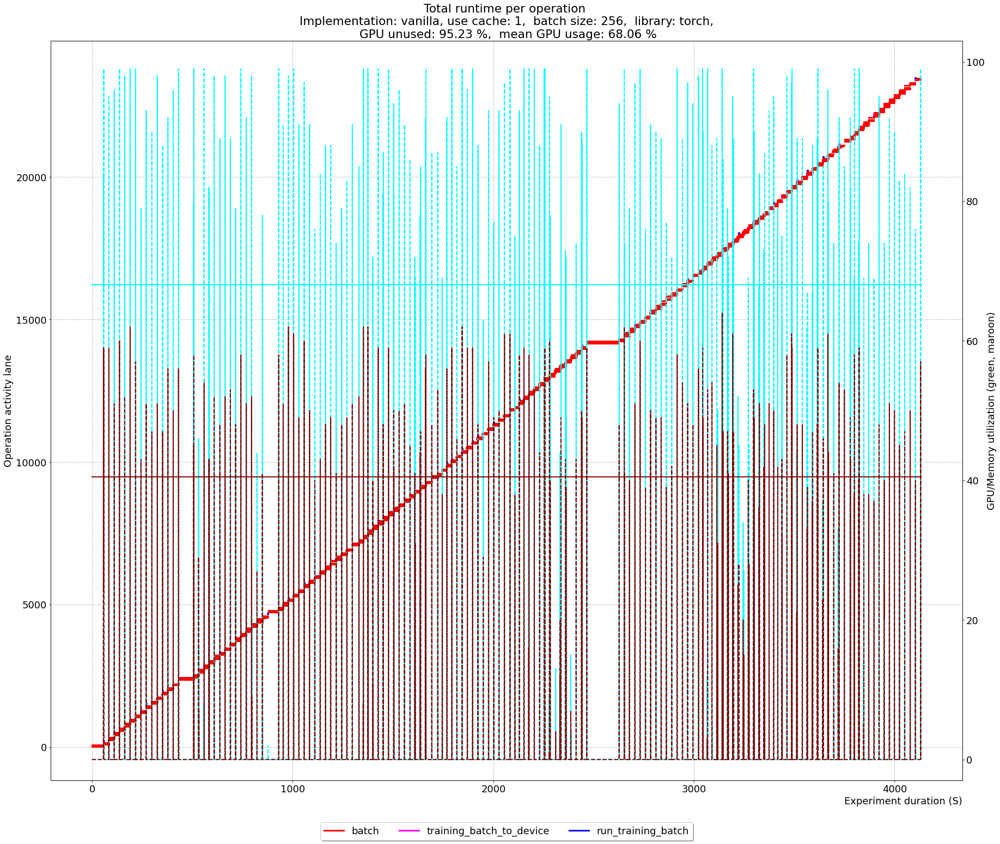

56.61506276150627 22.41031941031941


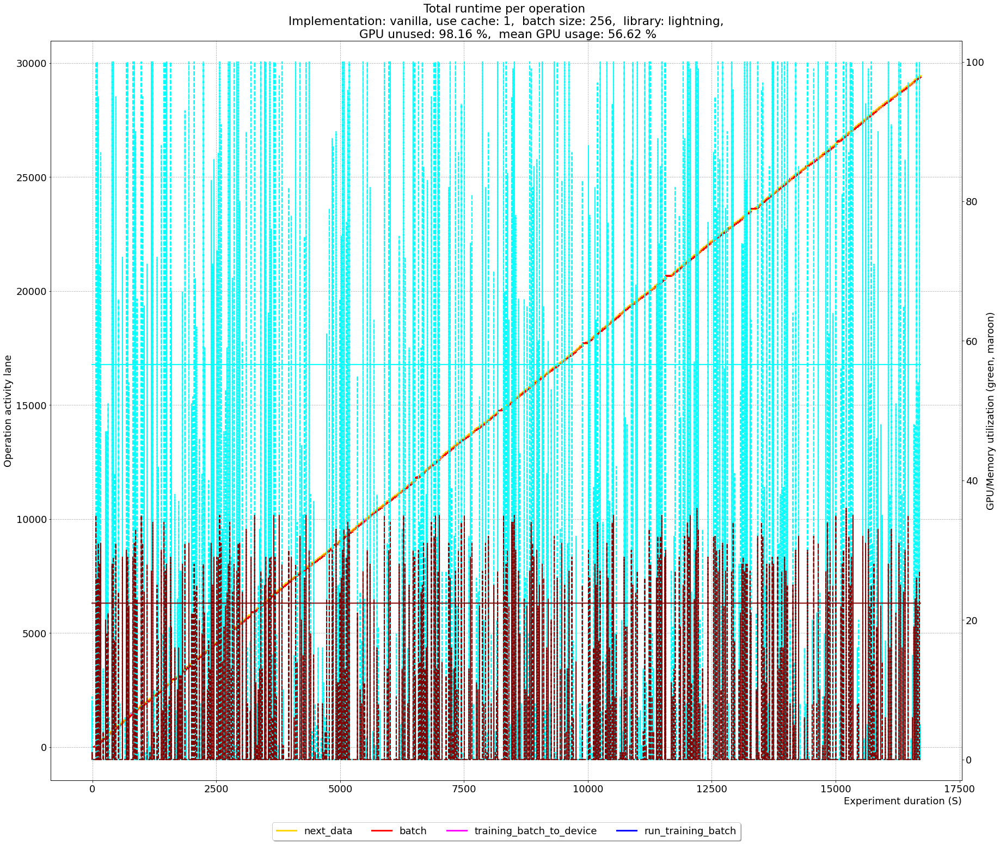

In [10]:
returns_s3 = []
for run in sorted(unique_runs_s3):
    df = df_dataloader_s3[df_dataloader_s3["run"]==run]
    dfgpu = df_gpuutil_s3[df_gpuutil_s3["run"]==run]
    returns_s3.append(show_timelines_with_gpu(df, dfgpu, colors, run, False, True, False, 2))

78.98814229249012 47.192


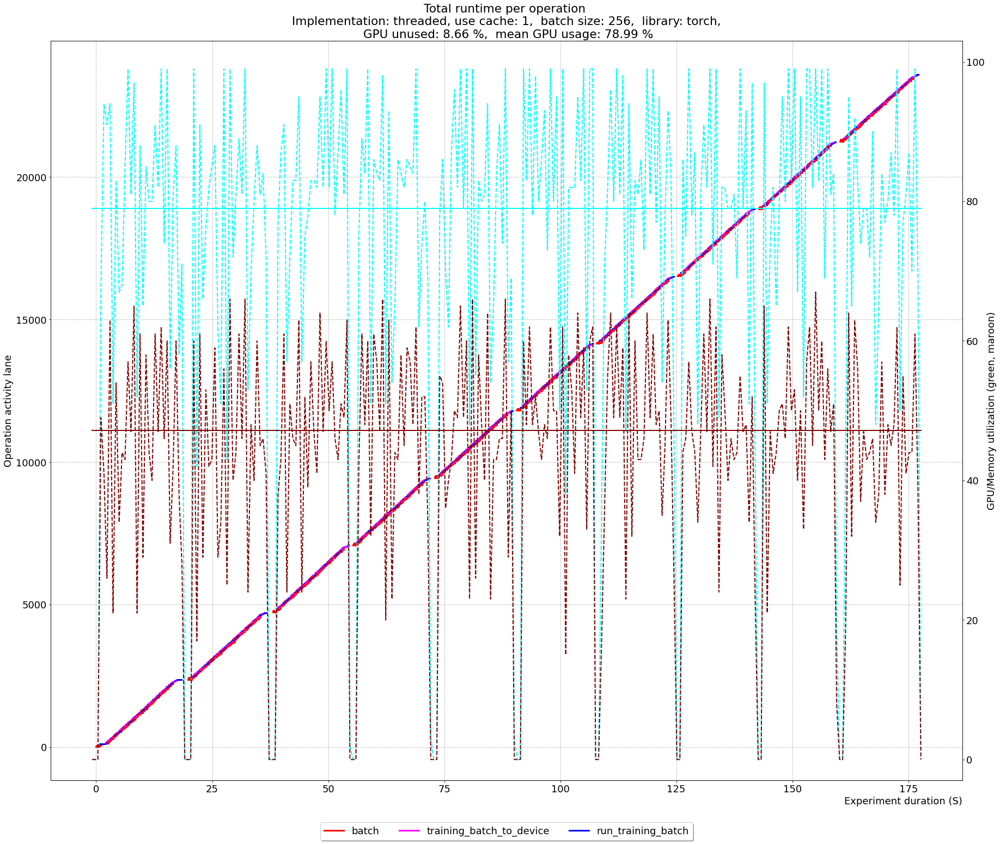

71.07291666666667 25.590027700831026


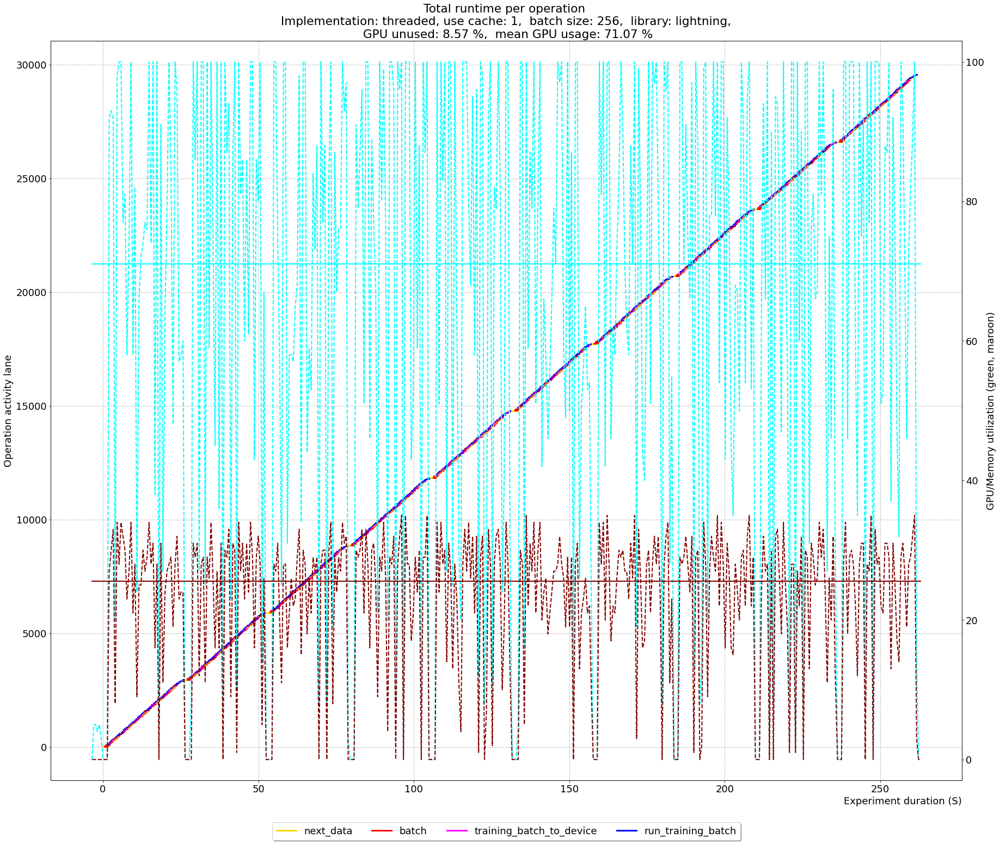

76.85714285714286 45.456


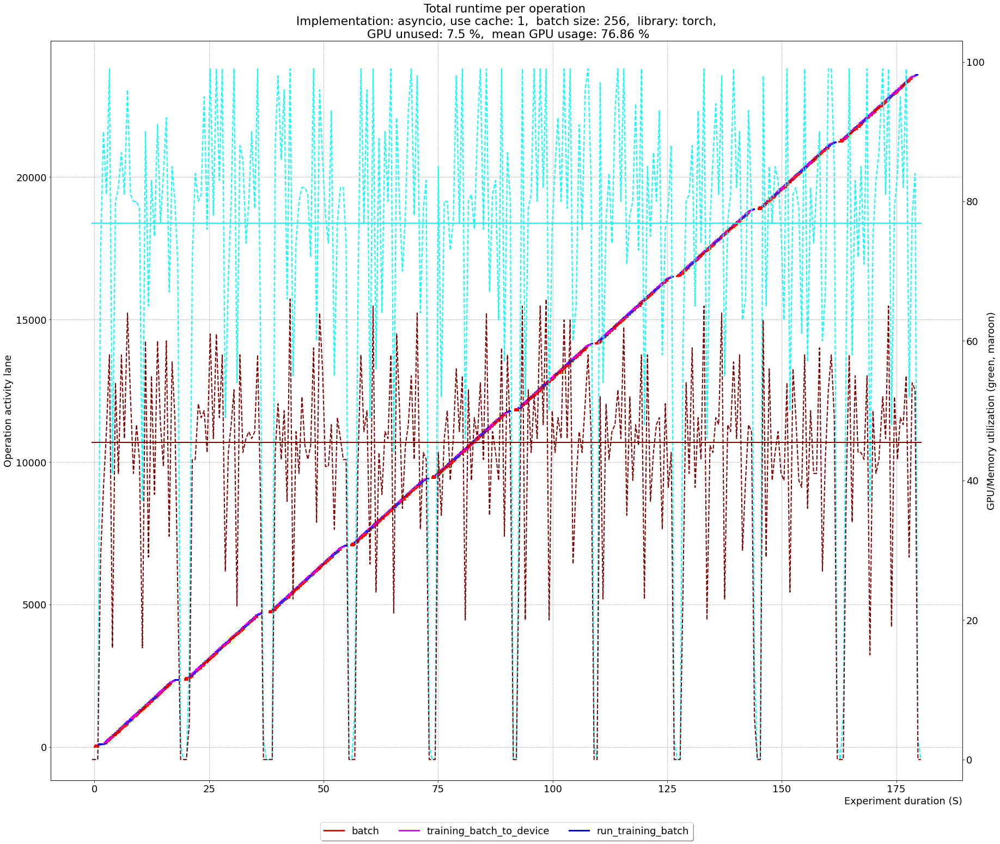

69.24871794871795 24.277628032345014


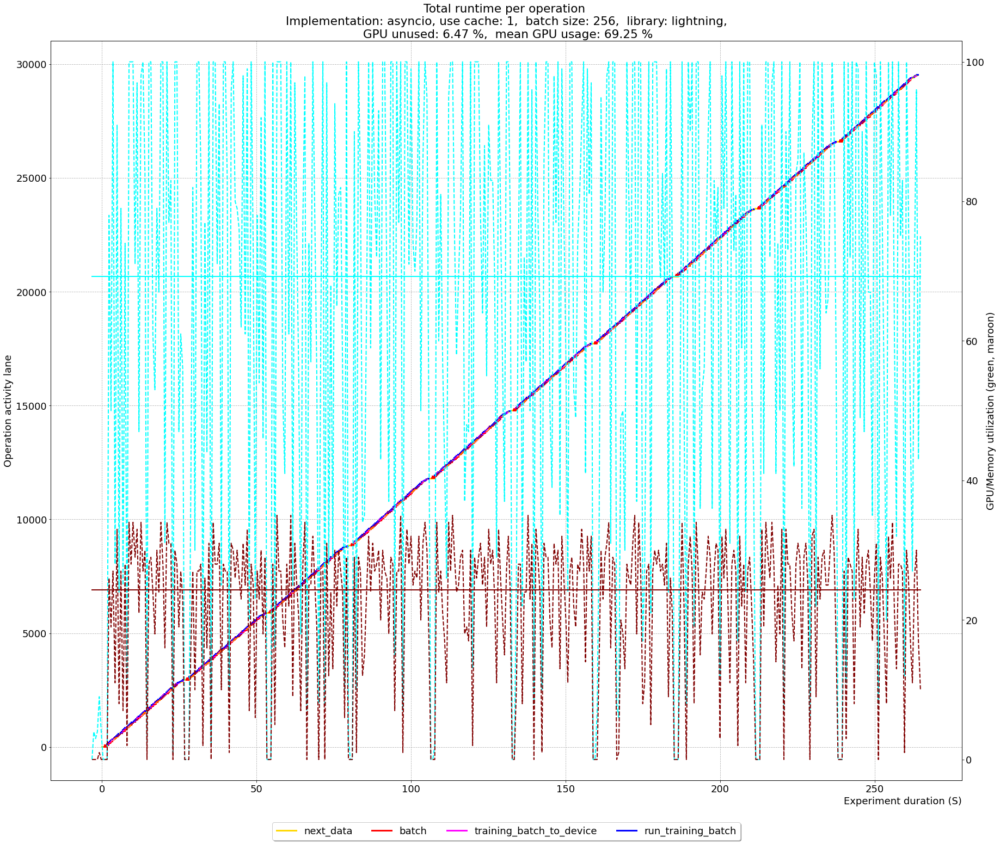

69.41353383458646 39.26377952755905


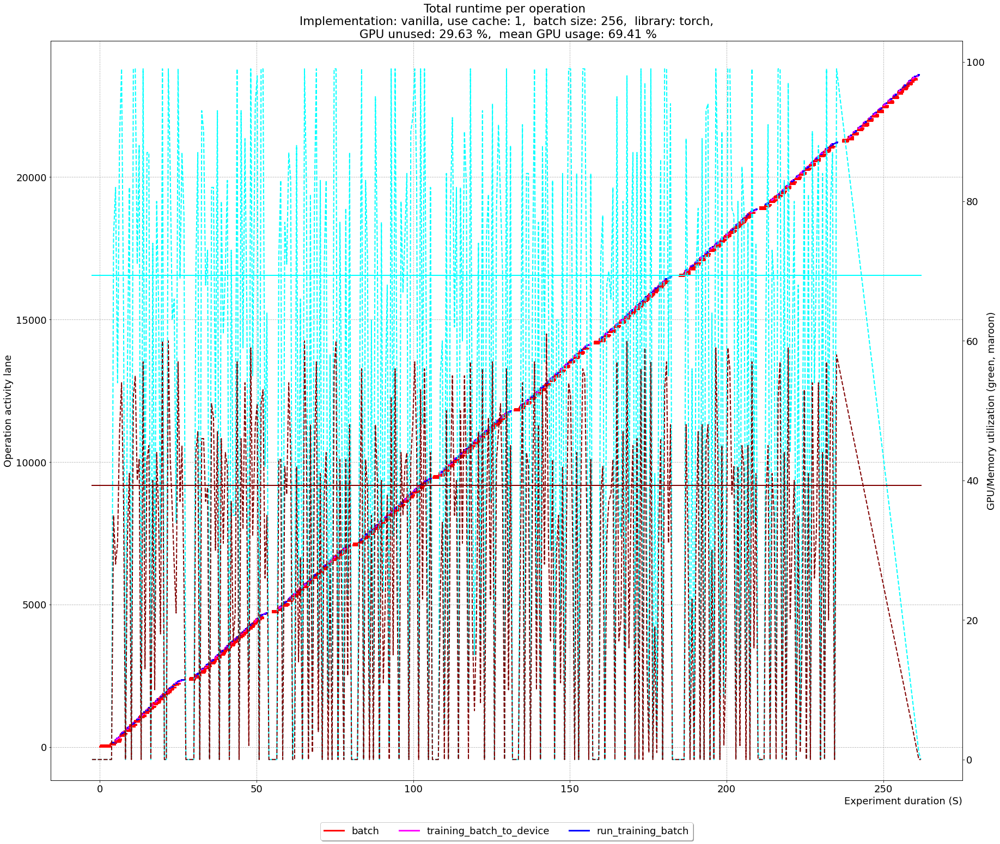

56.72808988764045 22.557951482479783


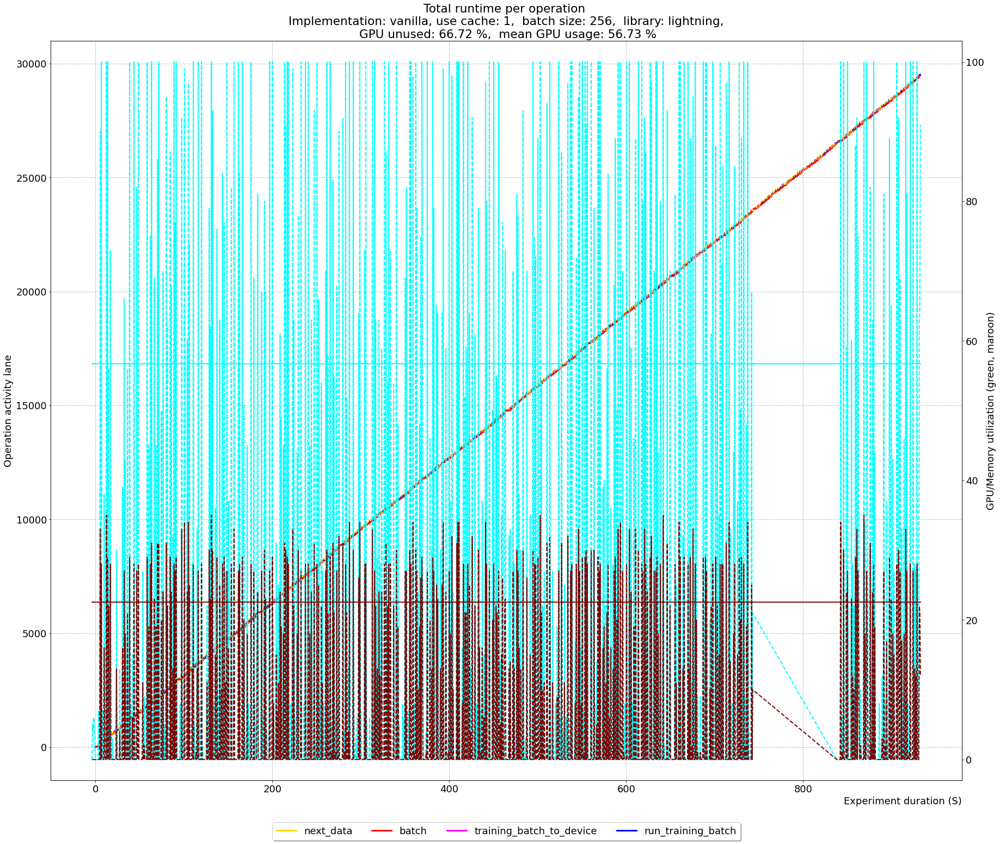

In [11]:
returns_scratch = []
for run in sorted(unique_runs_scratch):
    df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
    dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
    returns_scratch.append(show_timelines_with_gpu(df, dfgpu, colors, run, False, True, False, 2))

### Result tables

The following two tables display throughput details for both experiments. The default sample size, i.e. number of dataset items is 15000.

In [12]:
samples = 15000

#### AWS S3

In [13]:
results = pd.DataFrame.from_records(data=returns_s3)
results["throughput"] = samples / results["runtime"]
results.sort_values(["runtime", "library"], ascending=True).round(2)

,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,throughput
1,556.82,49.66,60.66,10.21,23.56,threaded,1,lightning,26.94
3,563.38,47.40,61.25,10.79,22.88,asyncio,1,lightning,26.63
0,576.66,62.63,61.15,12.74,37.05,threaded,1,torch,26.01
2,577.84,63.50,62.53,12.95,38.80,asyncio,1,torch,25.96
4,4130.36,95.23,68.06,1.79,40.52,vanilla,1,torch,3.63
5,16710.24,98.16,56.62,0.35,22.41,vanilla,1,lightning,0.90


#### Scratch

In [14]:
results = pd.DataFrame.from_records(data=returns_scratch)
results["throughput"] = samples / results["runtime"]
results.sort_values(["runtime", "library"], ascending=True).round(2)

,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,throughput
0,176.99,8.66,78.99,42.59,47.19,threaded,1,torch,84.75
2,179.34,7.50,76.86,40.59,45.46,asyncio,1,torch,83.64
4,261.22,29.63,69.41,26.38,39.26,vanilla,1,torch,57.42
1,261.83,8.57,71.07,22.00,25.59,threaded,1,lightning,57.29
3,263.89,6.47,69.25,21.60,24.28,asyncio,1,lightning,56.84
5,931.86,66.72,56.73,6.26,22.56,vanilla,1,lightning,16.10
